# **Analysis of Boston crime reports**

We are about to embark on a journey to explore the crime reports recorded in Boston. 

In particular, we answer the following questions:
1. What types of crimes are most common? 
2. How are they related to Location and Time?
3. Which are the dangerous and safe areas in Boston?

In [1]:
# Let's import some essentials
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

Now let's read in the data.

In [2]:
df = pd.read_csv("../input/crimes-in-boston/crime.csv",encoding='latin-1')
df.head(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


## ** Understanding the variables **

*** This data was obtained from [this](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/9c30453a-fefa-4fe0-b51a-5fc09b0f4655?view_id=380adcd5-c841-4320-a9fa-604e7a6a94f5) link. ***
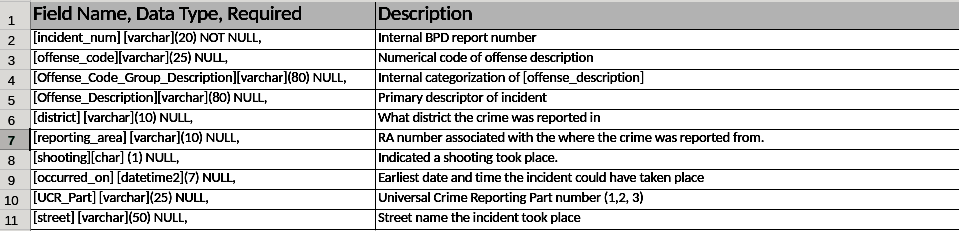


So I have identified three categories of variables here. 
1. *Location* variables like DISTRICT, REPORTING_AREA, STREET, Lat, Long, Location 
2. *Nature* of the crime like OFFENSE_CODE, OFFENSE_CODE_GROUP, OFFENSE_DESCRIPTION, UCR_PART
3. *Time* variables like OCCURED_ON_DATE, YEAR, MONTH, DAY_OF_WEEK, HOUR

Intuitively, 1. and 2. will influence the kind as well as frequency of crimes.

### ** Removing less useful variables**

By observing the variables, it can be easily deduced that the Location variable is just storing the concatenation of the Lat and Long, so let's get rid of this.

In [3]:
df = df.drop("Location", axis = 1)

Next we have variables like INCIDENT_NUMBER and OFFENSE_CODE, which serve no purpose in answering our questions. So, let's get rid of them too.

In [4]:
df = df.drop(["INCIDENT_NUMBER", "OFFENSE_CODE"], axis = 1)
df.head(5)

,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long
0,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371
1,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300
2,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429
3,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664
4,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361


### **Missing Values **

The column SHOOTING appears to have nothing but NaN values. Let's confirm that.

In [5]:
df['SHOOTING'].describe()

count     1019
unique       1
top          Y
freq      1019
Name: SHOOTING, dtype: object

In [6]:
df["SHOOTING"].isna().sum()

318054

Most of the entries are NaNs, but there are a few 'Y's in there too. But according to the descriptions of the variables in the table given above, NaN corresponds to "no shooting" incident. So let's change NaN to 'N'.

In [7]:
df["SHOOTING"].fillna('N', inplace=True)
df.head(5)

,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long
0,Larceny,LARCENY ALL OTHERS,D14,808,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371
1,Vandalism,VANDALISM,C11,347,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300
2,Towed,TOWED MOTOR VEHICLE,D4,151,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429
3,Investigate Property,INVESTIGATE PROPERTY,D4,272,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664
4,Investigate Property,INVESTIGATE PROPERTY,B3,421,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361


In [8]:
df.OFFENSE_CODE_GROUP.isna().sum()

0

NaNs may also occur in other variables. So, let's check that.

*** Examining the YEAR variable ***

In [9]:
years = [2015, 2016, 2017, 2018]
for year in years:
    print(df[df["YEAR"] == year]["MONTH"].unique())

[ 7  6 12 11 10  9  8]
[ 1  7  8  5  9 10  4 12  6 11  3  2]
[11 10  8  6 12  1  9  4  3  2  7  5]
[9 8 6 7 5 2 4 3 1]


* Complete data is available for the years 2016 and 2017.
* 2015 : data available from June onwards, 2018: data available till September.

Other *** Time *** variables: HOUR, DAY_OF_WEEK, MONTH, OCCURRED_ON_DATE

In [10]:
time_list = ["HOUR", "DAY_OF_WEEK", "MONTH", "OCCURRED_ON_DATE"]
for item in time_list:
    print("No. of NaNs in {} = {}".format(item, df[item].isna().sum()))

No. of NaNs in HOUR = 0
No. of NaNs in DAY_OF_WEEK = 0
No. of NaNs in MONTH = 0
No. of NaNs in OCCURRED_ON_DATE = 0


*** Location *** variables: DISTRICT, REPORTING_AREA, STREET, Lat, Long, Location

In [11]:
locations_list = ["DISTRICT", "REPORTING_AREA", "STREET", "Lat", "Long"]
for item in locations_list:
    print("No. of NaNs in {} = {}".format(item, df[item].isna().sum()))

No. of NaNs in DISTRICT = 1765
No. of NaNs in REPORTING_AREA = 0
No. of NaNs in STREET = 10871
No. of NaNs in Lat = 19999
No. of NaNs in Long = 19999


DISTRICT and STREET have missing values. REPORTING_AREA looks like a good variable to consider, since it has no missing values. But, let's also have a look at Lat and Long.

In [12]:
df["Long"].describe()

count    299074.000000
mean        -70.908272
std           3.493618
min         -71.178674
25%         -71.097135
50%         -71.077524
75%         -71.062467
max          -1.000000
Name: Long, dtype: float64

Lat is assigned to -1 to indicate an absence. Similarly, for Long, -1 indicates absence. Let's replace -1 with None.

In [13]:
df["Lat"].replace(-1, None, inplace=True)
df["Long"].replace(-1, None, inplace=True)
(df["Long"].isna()).sum()

20044

### ** Univariate Analysis **

*** Visualizations ***

We can start with plotting the histogram of a variable like "OFFENSE_CODE". The plot will not be too clear because we have 67 types of offenses in total. Let's just take the top 10 most frequent and plot their histogram.

In [14]:
def plot_quantitative(df, col1=None, col2=None, hue=None, k=10, palette=None):
    if col2 == None:
        col2 = col1
    sns.catplot(x=col1, y=col2, kind='count', height=8, aspect=1.5,
                order=df[col2].value_counts().index[0:k],
                hue=hue, data=df, palette=palette)
    plt.show()

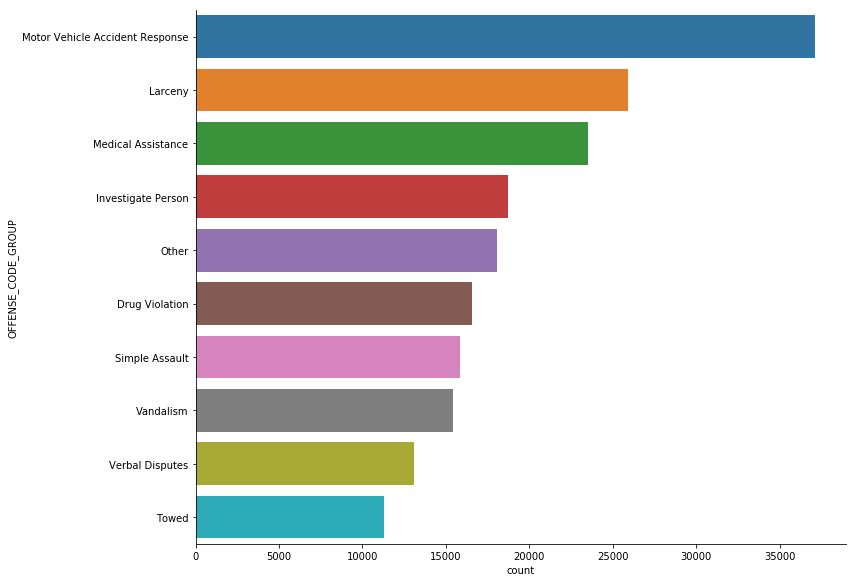

In [15]:
plot_quantitative(df, None, "OFFENSE_CODE_GROUP", None, 10)

## Answering question 1: What types of crime are most common?

The above plot shows the top 10 most frequent crimes in Boston. They are Motor Vehicle Accident, Larceny, Medical Assistance, Investigate Person, Other, Drug Violation, Simple Assault, Vandalism, Verbal Disputes, Towed.

Next we take a look at the UCR_PART variable of the top 10 most frequent crimes. According to [UCR](https://www.ucrdatatool.gov/offenses.cfm), offenses with Part One tag are among the serious crimes, those with the tag Part Two and Three are less serious crimes.

Using this info, let's create a histogram showing the top 5 crimes in each category.

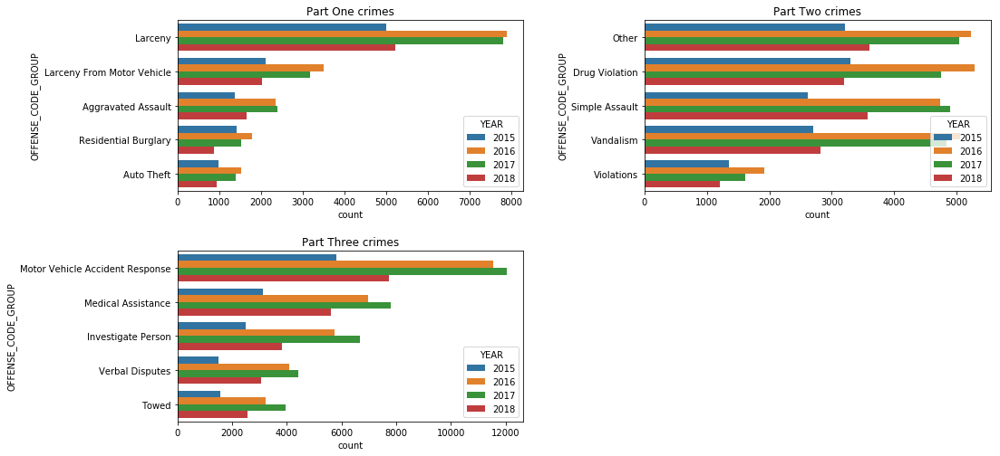

In [16]:
df_part_one = df[df["UCR_PART"] == "Part One"]
df_part_two = df[df["UCR_PART"] == "Part Two"]
df_part_three = df[df["UCR_PART"] == "Part Three"]
plt.figure(figsize=(14, 7))
plt.subplots_adjust(bottom=0.0001, left=0.01, wspace=0.35, hspace=0.35)
col = "OFFENSE_CODE_GROUP"
k = 5
plt.subplot(221)
plt.title('Part One crimes')
plt.ylabel('OFFENSE_CODE_GROUP')
sns.countplot(y=col, data=df_part_one, hue="YEAR", order=df_part_one[col].value_counts().index[0:k])
plt.subplot(222)
plt.title('Part Two crimes')
plt.ylabel(' ')
sns.countplot(y=col, data=df_part_two, hue="YEAR", order=df_part_two[col].value_counts().index[0:k])
plt.subplot(223)
plt.title('Part Three crimes')
plt.ylabel(' ')
sns.countplot(y=col, data=df_part_three, hue="YEAR", order=df_part_three[col].value_counts().index[0:k])
plt.show()

*Observations*

* In the serious offenses category, significant ($\geq 4000$) occurences of larceny are observed in all years.
* In the less serious offenses category, significant ($\geq 4000$) occurences of the crimes shown in the above plots are observed.


## Answering question 2: How are they related to Location and Time?

We perform some analysis on the variables in order to arrive at an answer to question part 2.

## ** Multivariate Analysis **

Now let's see the relation between YEAR and OFFENSE_CODE_GROUP.

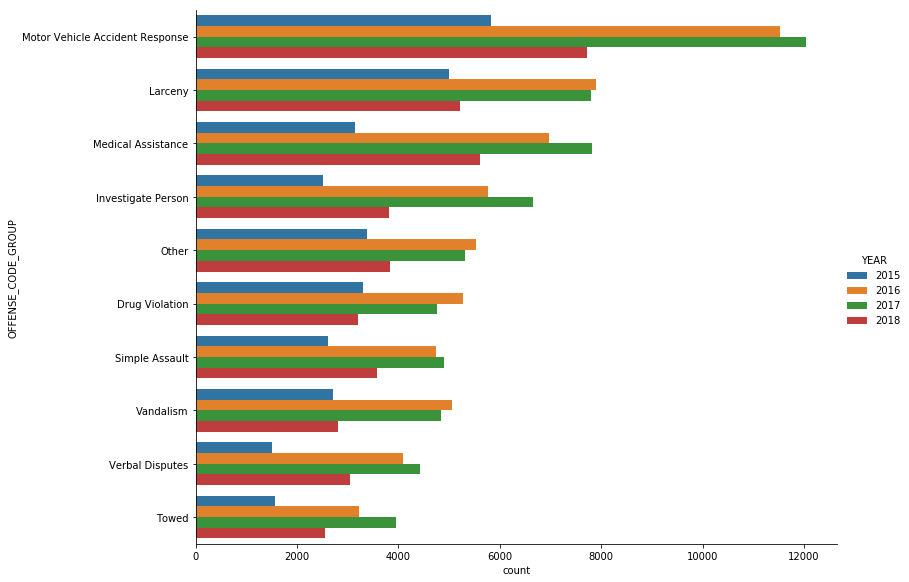

In [17]:
hue = "YEAR"
col1 = "OFFENSE_CODE_GROUP"
plot_quantitative(df, None, col1, hue, 10)

This graph plots the count of the incident I for any year Y, to check try the following code.

In [18]:
(df[df["OFFENSE_CODE_GROUP"] == "Towed"]["YEAR"] == 2017).sum()

3951

*** Inferences ***

* The least amount of offenses occur in the year 2015 except in one.
* The year 2016 seems to have more crimes than 2015, but lesser crimes than 2017.
* In almost all offenses, the year 2017 seems to have the majority of crimes.
* 2018 exhibits a decline in crimes.

*** Correctness of the inferences *** [TODO]

* 2015 and 2018 do not have data for all months. So the previous conclusions need not be true.

## Statistical tests for multivariate analysis
** $\chi^2$ test of independence **
 
 $H_0$ : There is no relationship between YEAR and OFFENSE_CODE_GROUP
 
 1. Construct the crosstab for the two variables.

In [19]:
def construct_crosstab(col1_name, col2_name):
    ct = pd.crosstab(df[col1_name], df[col2_name])
    return ct

In [20]:
ct = construct_crosstab("YEAR", "OFFENSE_CODE_GROUP")

2. Compute chi-square statistic and pvalue.

In [21]:
chi2, pvalue, dof, _ = stats.chi2_contingency(ct)

1. 3. If pvalue is less than 0.05, reject $H_0$.

In [22]:
pvalue

0.0

The pvalue is less than 0.05, so we reject $H_0$. Thus YEAR and OFFENSE_CODE_GROUP are related.

** Testing degree of correlation between categorical variables **

We just saw that YEAR and OFFENSES_CODE_GROUP are related, but we do not know to what degree. Cramer's V gives out a degree of correlatedness. Let's try that.

In [23]:
def cramersV(chi2, num_samples, num_rows_in_ct, num_cols_in_ct):
    squared_phi = chi2/num_samples
    squared_phi_corr = max(0, squared_phi - ((num_cols_in_ct-1)*(num_rows_in_ct-1))/(num_samples-1))    
    row_corr = num_rows_in_ct - ((num_rows_in_ct-1)**2)/(num_samples-1)
    col_corr = num_cols_in_ct - ((num_cols_in_ct-1)**2)/(num_samples-1)
    return np.sqrt(squared_phi_corr / min( (col_corr-1), (row_corr-1)))

def compute_degree_of_relatedness(col1, col2):
    ct = construct_crosstab(col1, col2)
    chi2, pvalue, dof, _ = stats.chi2_contingency(ct)
    num_samples = ct.sum().sum()
    num_rows, num_cols = ct.shape
    return cramersV(chi2, num_samples, num_rows, num_cols)

In [24]:
degree_year = compute_degree_of_relatedness("YEAR", "OFFENSE_CODE_GROUP")
degree_year

0.06449113612631771

This value is pretty low, which indicates lesser degree of correlatedness.

Now let's consider other ***Time*** variables.

The next logical time division is a quarter of a year, obtained as follows.
* Q1 = [Jan, Mar]
* Q2 = [Apr, Jun]
* Q3 = [Jul, Sep]
* Q4 = [Oct, Dec]

*** Adding a new column "QUARTER" to df ***

Pandas has an easy way of extracting the quarter information (using Series.dt.quarter) from a datetime object. First we must convert the OCCURRED_ON_DATE to datetime format.

In [25]:
df['OCCURRED_ON_DATE'] = pd.to_datetime(df['OCCURRED_ON_DATE'])
df.head(10)

,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long
0,Larceny,LARCENY ALL OTHERS,D14,808,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371
1,Vandalism,VANDALISM,C11,347,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300
2,Towed,TOWED MOTOR VEHICLE,D4,151,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429
3,Investigate Property,INVESTIGATE PROPERTY,D4,272,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664
4,Investigate Property,INVESTIGATE PROPERTY,B3,421,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361
5,Motor Vehicle Accident Response,M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY,C11,398,N,2018-09-03 21:09:00,2018,9,Monday,21,Part Three,TALBOT AVE,42.290196,-71.071590
6,Auto Theft,AUTO THEFT,B2,330,N,2018-09-03 21:25:00,2018,9,Monday,21,Part One,NORMANDY ST,42.306072,-71.082733
7,Verbal Disputes,VERBAL DISPUTE,B2,584,N,2018-09-03 20:39:37,2018,9,Monday,20,Part Three,LAWN ST,42.327016,-71.105551
8,Robbery,ROBBERY - STREET,C6,177,N,2018-09-03 20:48:00,2018,9,Monday,20,Part One,MASSACHUSETTS AVE,42.331521,-71.070853
9,Verbal Disputes,VERBAL DISPUTE,C11,364,N,2018-09-03 20:38:00,2018,9,Monday,20,Part Three,LESLIE ST,42.295147,-71.058608


In [26]:
df["QUARTER"] = df["OCCURRED_ON_DATE"].dt.quarter

A plot of the number of offenses in each quarter will be useful in giving us some idea about whether this variable is related to the offense type.

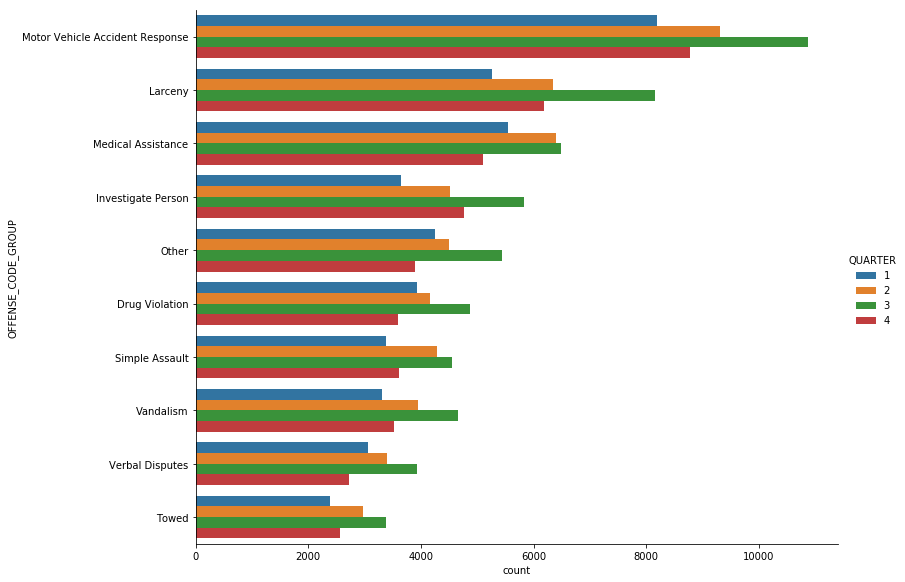

In [27]:
hue = "QUARTER"
col1 = "OFFENSE_CODE_GROUP"
plot_quantitative(df, None, col1, hue, 10)

Computing Cramer's V for QUARTER and OFFENSES_CODE_GROUP

In [28]:
degree_quarter = compute_degree_of_relatedness("QUARTER", "OFFENSE_CODE_GROUP")
degree_quarter

0.036412190126341074

Moving on to MONTH

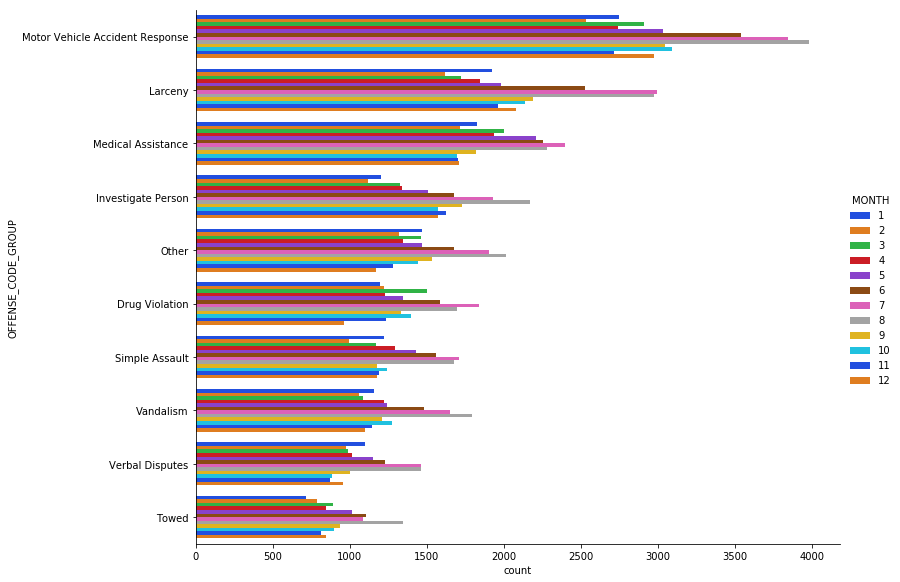

In [29]:
hue = "MONTH"
col1 = "OFFENSE_CODE_GROUP"
plot_quantitative(df, None, col1, hue, 10, "bright")

In [30]:
degree_month = compute_degree_of_relatedness("MONTH", "OFFENSE_CODE_GROUP")
degree_month

0.024988354531773626

HOUR vs OFFENSES_CODE_GROUP

In [31]:
degree_hour = compute_degree_of_relatedness("HOUR", "OFFENSE_CODE_GROUP")
degree_hour

0.0707725934011827

** Result of analysis of ** *** Time *** ** variables **

* The variable HOUR seems to have the most correlation to the OFFENSES_CODE_GROUP

** Analysis of ** *** Location *** ** based variables **

In [32]:
loc_list = ["STREET", "REPORTING_AREA", "DISTRICT", "Lat", "Long"]
degree = []
for loc in loc_list:
    degree.append(compute_degree_of_relatedness(loc, "OFFENSE_CODE_GROUP"))
degree

[0.15679204115817916,
 0.11924353850215587,
 0.1040600542023773,
 0.19095700399900123,
 0.1917091521096095]

So it turns out that Lat and Long are more related to the target variable than the others.

*** Observations ***

* ***Location*** variables seem to be more correlated to OFFENSE_CODE_GROUP that the ***Time*** variables, in particular the variable STREET.
* Among the other location variables, Lat and Long also appear to be related to OFFENSE_CODE_GROUP.

## Answering question 3: Which are the dangerous and safe areas in Boston? 

### Visualizing on a map

Now let's seen the locations of the occurence of serious crimes.

In [33]:
import folium
from folium.plugins import MarkerCluster

plot_data = df[df['UCR_PART'] == 'Part One'].dropna(axis = 0)
boston_crime_map = folium.Map(location = [plot_data['Lat'].mean(), 
                                          plot_data['Long'].mean()], 
                            zoom_start = 11
                             )
mc = MarkerCluster()
for row in plot_data.itertuples():
    mc.add_child(folium.Marker(location = [row.Lat,  row.Long]))

boston_crime_map.add_child(mc)

boston_crime_map

The above plot clearly shows certain areas of Boston where the number of serious crimes are high.

*Observations*

* Areas near the financial district appear to have many serious crimes.
* Certain parts of Boston like Pond Street have very few serious crimes.

Now let's get then names of streets with high crime rate and those with low crime rates.

In [34]:
df[df.UCR_PART == 'Part One']['STREET'].value_counts()[:10]

WASHINGTON ST        3190
BOYLSTON ST          2737
BLUE HILL AVE        1371
HUNTINGTON AVE       1123
TREMONT ST           1092
MASSACHUSETTS AVE    1089
NEWBURY ST           1038
DORCHESTER AVE        994
COMMONWEALTH AVE      938
HARRISON AVE          844
Name: STREET, dtype: int64

In [35]:
df[df.UCR_PART == 'Part One']['STREET'].value_counts()[-10:]

NIRA AVE            1
ALWARD RD           1
BRIGHAM ST          1
CUMMINGTON MALL     1
ALARIC TER          1
DOW RD              1
SAINT JAMES PL      1
GEM AVE             1
HIGH VIEW AVE       1
WASHINGTON ST 40    1
Name: STREET, dtype: int64

Summary: 

* BUSTBUY, LONG WHRF, ARLINGTON AVE etc have the lowest number of serious crimes.
* WASHINGTON ST, BOYLSTON ST, BLUE HILL AVE etc have the largest number of serious crimes.

Now let's look at the less serious crimes.

In [36]:
df[df.UCR_PART != 'Part One']['STREET'].value_counts()[:10]

WASHINGTON ST        11004
BLUE HILL AVE         6423
BOYLSTON ST           4484
DORCHESTER AVE        4155
HARRISON AVE          3765
TREMONT ST            3704
CENTRE ST             3636
MASSACHUSETTS AVE     3619
COMMONWEALTH AVE      3196
HYDE PARK AVE         3030
Name: STREET, dtype: int64

Now, that's interesting! WASHINGTON ST still appears in this list. Looks like it has a very high number of crimes in general. In addition there are streets like BOYLSTON ST that have large number of less serious offenses, which were found to have the least number of serious offenses.

Regardless of the type of crimes, the following streets have the majority of crimes reported in Boston.

In [37]:
df['STREET'].value_counts()[:10]

WASHINGTON ST        14194
BLUE HILL AVE         7794
BOYLSTON ST           7221
DORCHESTER AVE        5149
TREMONT ST            4796
MASSACHUSETTS AVE     4708
HARRISON AVE          4609
CENTRE ST             4383
COMMONWEALTH AVE      4134
HYDE PARK AVE         3470
Name: STREET, dtype: int64